In [75]:
import numpy as np
import pandas as pd
import os
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import time
from PIL import Image
import cv2
import random
from tqdm import tqdm
import shutil

In [4]:
data_dir = '/kaggle/input/gan-getting-started'
os.listdir(data_dir)

['monet_jpg', 'photo_tfrec', 'photo_jpg', 'monet_tfrec']

# Problem Description

The goal of this project is to generate 7000 to 10,000 Monet-style images. I will implement this model as a Generative Adversarial Network (GAN). A GAN is built using two neural networks. One of the neural network models is a generator of the images. This model will generate new images in the style of Monet. The second neural network is the discriminator model, which will predict if the generated image is a real or synthetic Monet. The two models work against each other to improve the accuracy of both.

The accuracy of the models will be evaluated with MiFID (Memorization-informed Fréchet Inception Distance). This is a modification from Fréchet Inception Distance (FID). The smaller the MiFID, the better the generated images are at imitating Monet. 


The challenge provides a few resources which I use during the development of my models. These resources include a dataset description [1], demo of the MiFID calculation [2], a cycle-GAN tutorial that reviews loading data with TFRecords [3], and a description of the MiFID calculation [4].

[1] https://www.kaggle.com/c/gan-getting-started/data

[2] https://www.kaggle.com/code/wendykan/demo-mifid-metric-for-dog-image-generation-comp/notebook

[3] https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook

[4] https://www.kaggle.com/c/gan-getting-started/overview/evaluation

# Data Description

There are 300 Monet paintings available for training. They are (256, 256, 3) pixels in dimension. The three layers are for RGB colors. The Monet paintings are provided in both JPEG and TFRecord format. Similarly, there are 7,028 photos available to transform to the Monet style. These 7,028 photos are also (256, 256, 3) pixels and are available in JPEG and TFRecord format. For sizing of the delivery for evaluation, the output must be in an images.zip file and contain 7,000-10,000 images sized 256x256x3 (RGB).

# EDA

In [5]:
# Get files
monet_dir = '/kaggle/input/gan-getting-started/monet_jpg'
jpg_monet_files = [os.path.join(monet_dir, file) for file in os.listdir(monet_dir) if file.endswith(".jpg")]
photo_dir = '/kaggle/input/gan-getting-started/photo_jpg'
jpg_photo_files = [os.path.join(photo_dir, file) for file in os.listdir(photo_dir) if file.endswith(".jpg")]
val_photo_files = jpg_photo_files[0:30]

### Cleaning

The dataset is already relatively clean because it is a prepared Kaggle Dataset. Some cleaning that must occur is normalizing the images. Since our generator is going to produce data between -1 and 1, we want the input to also be normalized between -1 and 1. That is dividing the three color channels by 255/2=127.5 and then subtracting 1, so that the data is between -1 and 1. We perform this normalization as we load the image into the dataset. 

In [6]:
def load_image(image_file):
    # Read file as a tf object
    raw_image = tf.io.read_file(image_file)
    # Decode to three channels
    image = tf.io.decode_image(raw_image, channels = 3)
    # Cleaning: Normalize image between -1 and 1
    image = (tf.cast(image, tf.float32) / (255/2)) - 1
    # Reshape image to size
    image = tf.reshape(image, [256, 256, 3])
    # Return image
    return image

def create_dataset(files):
    # Load dataset as a tf Dataset object from tensor slices
    dataset = tf.data.Dataset.from_tensor_slices((files))
    # Map each file to the decoded image
    dataset = dataset.map(lambda file: load_image(file))
    # Return dataset object
    return dataset

# Create monet and photo datasets
monet_dataset = create_dataset(jpg_monet_files)
photo_dataset = create_dataset(jpg_photo_files)
val_dataset = create_dataset(val_photo_files)

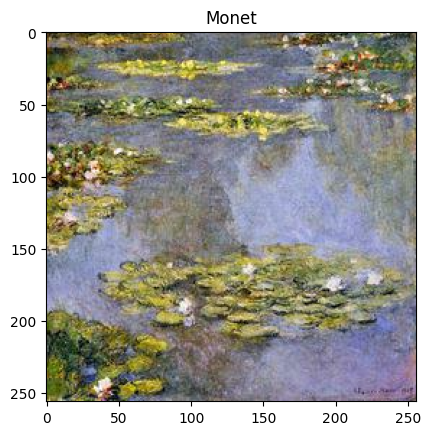

In [7]:
# Check that a file loads correctly
# Show a Monet File
plt.title('Monet')
dataset_iterable = iter(monet_dataset)
plt.imshow(next(dataset_iterable) * 0.5 + 0.5)
plt.show()
plt.close()

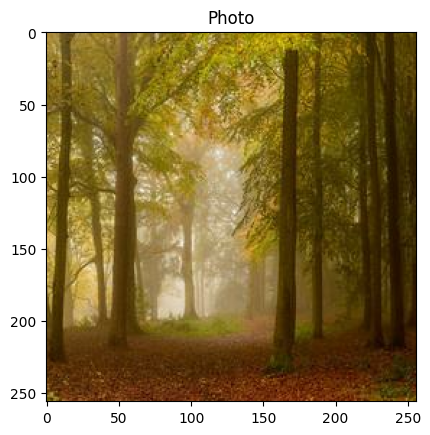

In [8]:
# Show an input image file
plt.title('Photo')
plt.imshow(next(iter(photo_dataset)) * 0.5 + 0.5)
plt.show()
plt.close()

Monet Color Ranges - Column is one Image


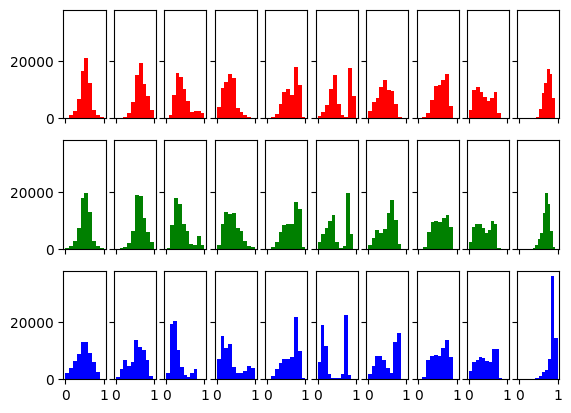

In [9]:
# Visualize color ranges for 10 monet
print("Monet Color Ranges - Column is one Image")
monet_iterable = iter(monet_dataset)
fig, axs = plt.subplots(3, 10, sharey = True, sharex = True)
for i in range(10):
    image = next(monet_iterable) * 0.5 + 0.5
    red = image[:,:,0].numpy().flatten()
    green = image[:,:,1].numpy().flatten()
    blue = image[:,:,2].numpy().flatten()
    axs[0, i].hist(red, color = "red")
    axs[1, i].hist(green, color="green")
    axs[2, i].hist(blue, color="blue")
plt.show()
plt.close()


Photo Color Ranges - Column is one Image


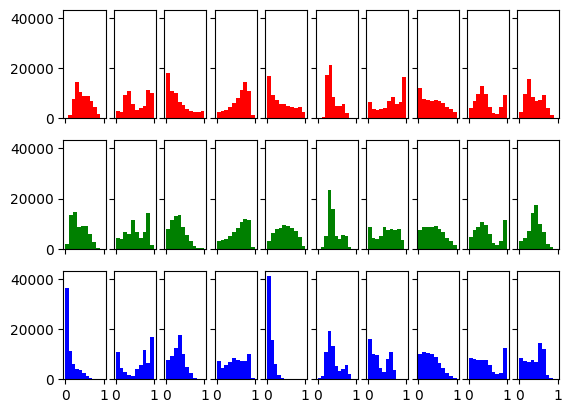

In [10]:
photo_iterable = iter(photo_dataset)
print("Photo Color Ranges - Column is one Image")
fig, axs = plt.subplots(3, 10, sharey = True, sharex = True)
for i in range(10):
    image = next(photo_iterable) * 0.5 + 0.5
    red = image[:,:,0].numpy().flatten()
    green = image[:,:,1].numpy().flatten()
    blue = image[:,:,2].numpy().flatten()
    axs[0, i].hist(red, color = "red")
    axs[1, i].hist(green, color="green")
    axs[2, i].hist(blue, color="blue")
plt.show()
plt.close()

The Monet paintings and photos both have a wide range of color intensity on the RGB scale. Color will not need to be a feature that our generator model considers. 

# Model Architecture

I will be implementing a Deep Convolutional Generative Adversarial Network (DCGAN). DCGANs are known to work well for image generation. To build the DCGAN, the generator contains convolution-transpose layers, batch normalization layers, and ReLU activation functions. The discriminator contains convolution layers, batch normalization layers, and LeakyReLU activation functions. The discriminator predicts whether the input is from the real data or not. The generator creates a new image that should be representative of the style from the training set. 


### Generator

Using Conv2D and Batch Normalization layers, we first reduce the 256x256x3 image to 16x16x256, then build the image back to 256x256x3 with Conv2DTranspose layers.

In [11]:
def build_generator():
    # Initialize model
    model = models.Sequential()
    
    # Start with the input that reduces the image down
    model.add(layers.Conv2D(filters=32, kernel_size=(3,3), strides=(2,2), padding='same', input_shape=[256, 256, 3], activation='relu'))
    # Reduce image
    model.add(layers.Conv2D(filters=64, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu'))
    model.add(layers.BatchNormalization())
    # Reduce image
    model.add(layers.Conv2D(filters=128, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu'))
    model.add(layers.BatchNormalization())
    # Reduce image
    model.add(layers.Conv2D(filters=256, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu'))
    model.add(layers.BatchNormalization())

    
    # Start Rebuilding
    # Now that the image is 16x16, rebuild to generate a new image
    # Start with a 2D convolution transpose layer to upsample to 32 by 32
    model.add(layers.Conv2DTranspose(filters=256, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu'))
    # 64 by 64
    model.add(layers.Conv2DTranspose(filters=128, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu'))
    # 128 by 128
    model.add(layers.Conv2DTranspose(filters=64, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu'))
    # 256 by 256
    model.add(layers.Conv2DTranspose(filters=32, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu'))
    # Output with 3 layers for color
    model.add(layers.Conv2DTranspose(filters=3, kernel_size=(3,3), strides=(1,1), padding='same', activation='tanh'))
    return model

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 batch_normalization (BatchN  (None, 64, 64, 64)       256       
 ormalization)                                                   
                                                                 
 conv2d_2 (Conv2D)           (None, 32, 32, 128)       73856     
                                                                 
 batch_normalization_1 (Batc  (None, 32, 32, 128)      512       
 hNormalization)                                                 
                                                                 
 conv2d_3 (Conv2D)           (None, 16, 16, 256)       2

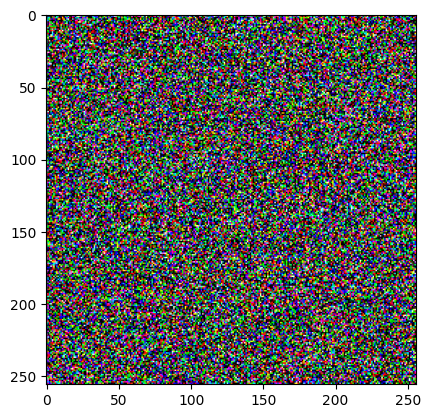

1/1 [==============================] - 8s 8s/step


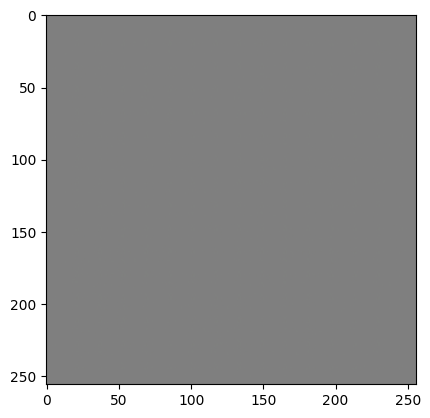

In [12]:
# Test what the generator does pre training with a noise image
generator = build_generator()
generator.summary()

noise = tf.random.normal([1, 256, 256, 3])
plt.imshow(noise[0])
plt.show()
plt.close()
plt.imshow(generator.predict(noise)[0] * 0.5 + 0.5)
plt.show()
plt.close()

### Discriminator

In [13]:
def build_discriminator(alpha, dropout):
    model = models.Sequential()
    # Initial Layer
    model.add(layers.Conv2D(filters=32, kernel_size=(3,3), strides=(2,2), padding='same', input_shape=[256, 256, 3], activation='relu'))
    model.add(layers.LeakyReLU(alpha=alpha))
    # Reduce image
    model.add(layers.Conv2D(filters=64, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))
    # Reduce image
    model.add(layers.Conv2D(filters=128, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))
    # Reduce image
    model.add(layers.Conv2D(filters=256, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))
    # Reduce image
    model.add(layers.Conv2D(filters=512, kernel_size=(3,3), strides=(2,2), padding='same', activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=alpha))
    # Flatten
    model.add(layers.Flatten())
    # Dropout
    model.add(layers.Dropout(dropout))
    # Output Layer
    model.add(layers.Dense(1, activation='sigmoid'))
    
    return model

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 128, 128, 32)      896       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 128, 128, 32)      0         
                                                                 
 conv2d_5 (Conv2D)           (None, 64, 64, 64)        18496     
                                                                 
 batch_normalization_3 (Batc  (None, 64, 64, 64)       256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 64, 64, 64)        0         
                                                                 
 conv2d_6 (Conv2D)           (None, 32, 32, 128)       73856     
                                                      

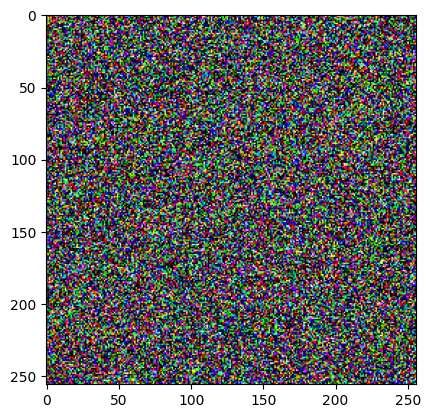

1/1 [==============================] - 0s 156ms/step


array([[0.502615]], dtype=float32)

In [14]:
# Test what the discriminator does pre training with noise
discriminator = build_discriminator(0.2, 0.3)
discriminator.summary()

noise = tf.random.normal([1, 256, 256, 3])
plt.imshow(noise[0])
plt.show()
plt.close()
discriminator.predict(noise)

### GAN Model

In [15]:
# Special Loss for Generator
def custom_generator_loss(synthetic_image):
    return tf.keras.losses.BinaryCrossentropy()(tf.ones_like(synthetic_image, dtype=tf.float32), synthetic_image)

In [16]:
# GAN Model 
class GAN:
    def __init__(self, epochs, batch_size, generator, discriminator, train_data, learning_rate, val_data):
        self.epochs = epochs
        self.batch_size = batch_size
        self.generator = generator
        self.discriminator = discriminator
        self.train_data = train_data 
        self.learning_rate = learning_rate
        self.val_data = val_data
        
    def train(self):
        epoch_loss = []
        epoch_val_images = []
        for epoch in tqdm(range(self.epochs)):
            gen_loss = 0.0
            disc_loss = 0.0
            num_batches = 0.0
            for batch in tqdm(self.train_data.batch(self.batch_size)):
                if len(batch) == self.batch_size:
                    # Generate a random noise image for training
                    # Don't use the images in the photo set because we will use those for testing
                    noise = tf.random.normal([len(batch), 256, 256, 3])
                    # Initialize gradient tapes
                    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
                        # Produce generated images
                        generated_images = self.generator(noise, training=True)
                        # Capture real output from discriminator
                        real_output = self.discriminator(batch, training=True)
                        # Capture synthetic output from discriminator 
                        synthetic_output = self.discriminator(generated_images, training=True)
                        # Calculate losses
                        gen_loss += custom_generator_loss(synthetic_output)
                        disc_loss += tf.keras.losses.BinaryCrossentropy()(tf.cast(real_output, tf.float32), synthetic_output)
                        # Compute gradients
                        gen_grad = gen_tape.gradient(gen_loss, self.generator.trainable_variables)
                        disc_grad = disc_tape.gradient(disc_loss, self.discriminator.trainable_variables)
                        # Update wieghts
                        tf.keras.optimizers.Adam(learning_rate=self.learning_rate).apply_gradients(zip(gen_grad, self.generator.trainable_variables))
                        tf.keras.optimizers.Adam(learning_rate=self.learning_rate).apply_gradients(zip(disc_grad, self.discriminator.trainable_variables))
                        num_batches += 1
            # Return averaged loss
            epoch_loss.append((gen_loss + disc_loss) / (2*num_batches)) 
            print(f"Epoch {epoch+1} Loss: {epoch_loss[epoch]}")
            epoch_val_images.append(self.generator.predict(self.val_data.batch(1)))
        return epoch_loss, epoch_val_images


### Training

In [15]:
# Compile Generator
generator = build_generator()
generator.summary()
generator.compile(optimizer='adam', loss=custom_generator_loss, metrics=['AUC'])
# Compile Discriminator
discriminator = build_discriminator(0.2, 0.3)
discriminator.compile(optimizer='adam', loss=tf.keras.losses.BinaryCrossentropy(), metrics=['AUC'])
# Make gan model 
gan = GAN(10, 30, generator, discriminator, monet_dataset, 0.0001, val_dataset)
epoch_loss, epoch_val_images = gan.train()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 128, 128, 32)      896       
                                                                 
 conv2d_10 (Conv2D)          (None, 64, 64, 64)        18496     
                                                                 
 batch_normalization_7 (Batc  (None, 64, 64, 64)       256       
 hNormalization)                                                 
                                                                 
 conv2d_11 (Conv2D)          (None, 32, 32, 128)       73856     
                                                                 
 batch_normalization_8 (Batc  (None, 32, 32, 128)      512       
 hNormalization)                                                 
                                                                 
 conv2d_12 (Conv2D)          (None, 16, 16, 256)      

100%|██████████| 10/10 [01:21<00:00,  8.19s/it]


Epoch 1 Loss: 61.54072189331055
30/30 [==============================] - 0s 5ms/step


100%|██████████| 10/10 [01:09<00:00,  6.94s/it]

Epoch 2 Loss: 135.66921997070312
23/30 [======================>.......] - ETA: 0s

30/30 [==============================] - 0s 5ms/step


100%|██████████| 10/10 [01:21<00:00,  8.19s/it]

Epoch 3 Loss: 209.52450561523438
22/30 [=====================>........] - ETA: 0s

30/30 [==============================] - 0s 5ms/step


100%|██████████| 10/10 [01:10<00:00,  7.08s/it]

Epoch 4 Loss: 234.3311004638672
22/30 [=====================>........] - ETA: 0s

30/30 [==============================] - 0s 5ms/step


100%|██████████| 10/10 [01:08<00:00,  6.82s/it]

Epoch 6 Loss: 247.049560546875
30/30 [==============================] - 0s 5ms/step



100%|██████████| 10/10 [01:21<00:00,  8.19s/it]

Epoch 7 Loss: 248.5631103515625
30/30 [==============================] - 0s 5ms/step



100%|██████████| 10/10 [01:08<00:00,  6.87s/it]

Epoch 8 Loss: 252.000732421875
30/30 [==============================] - 0s 5ms/step



100%|██████████| 10/10 [01:21<00:00,  8.19s/it]

Epoch 10 Loss: 248.0813751220703
23/30 [======================>.......] - ETA: 0s

30/30 [==============================] - 0s 5ms/step


100%|██████████| 10/10 [12:24<00:00, 74.44s/it]


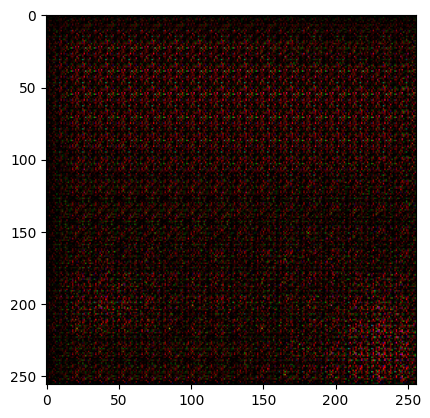

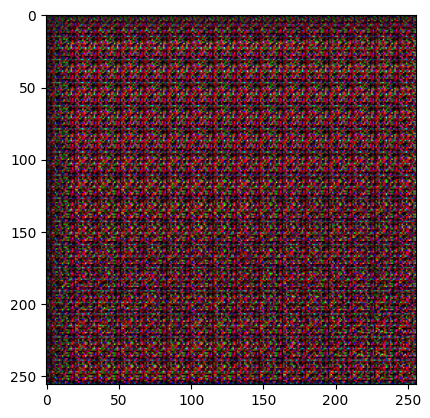

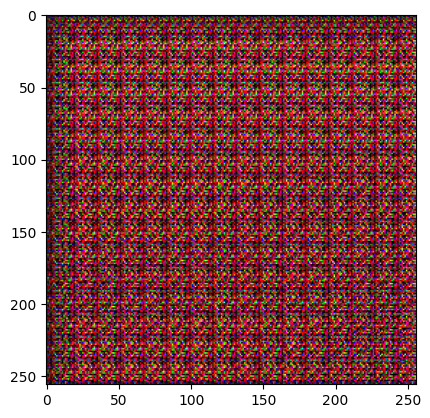

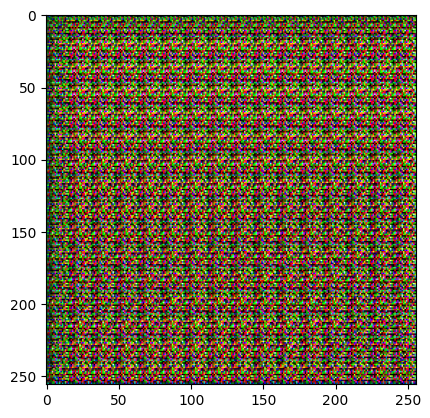

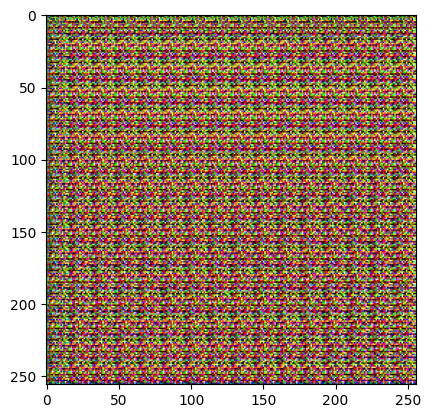

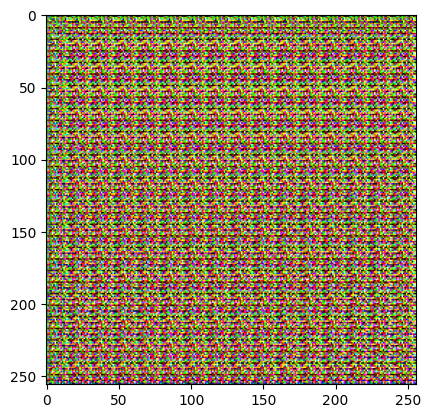

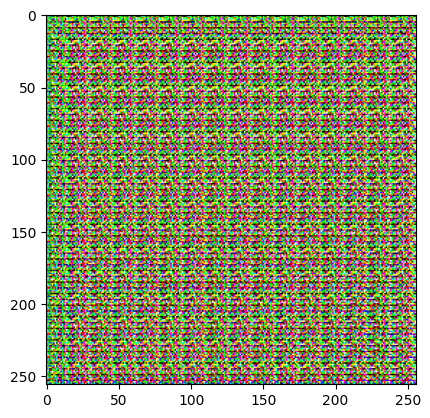

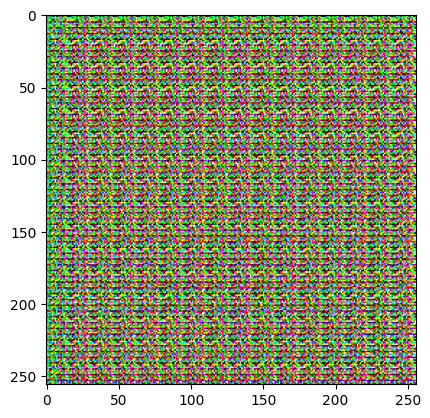

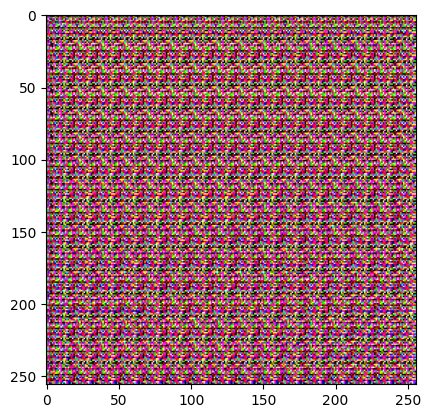

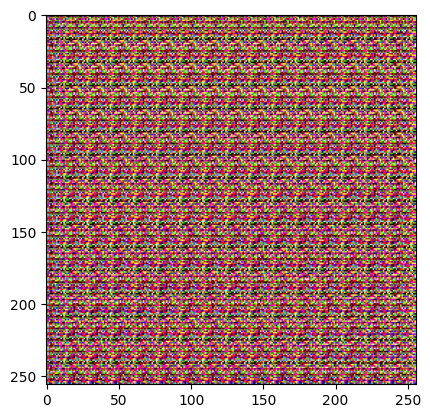

In [16]:
for i in range(len(epoch_val_images)):
    plt.imshow(epoch_val_images[i][1] * 255)
    plt.show()
    plt.close()

In [17]:
predictions = gan.generator.predict(val_dataset.batch(1))

30/30 [==============================] - 0s 5ms/step


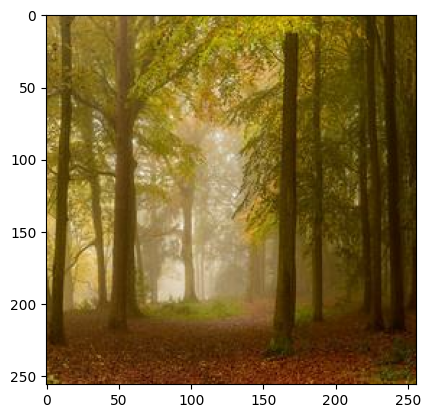

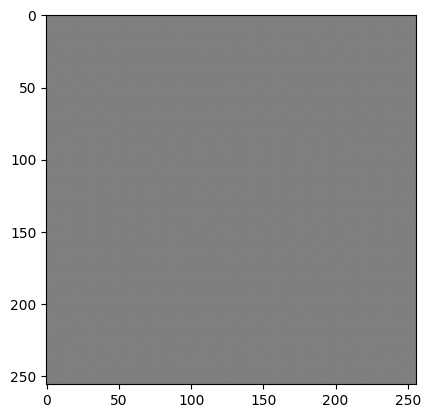

In [18]:
plt.imshow(next(iter(val_dataset )) * 0.5 + 0.5)
plt.show()
plt.close()
plt.imshow((predictions[0] + 1 ) / 2)
plt.show()
plt.close()

This model does not work. The output is gray. This may be because of the number of epochs is low, but we will try a different architecture to determine if that is the issue.

### Second Model Architecture

As the first GAN architecture did not yield great results, I will be implementing a CycleGAN, as that is what is provided in the tutorial associated with the Kaggle competition [3]. I will continue to use the generator and discriminator as implemented above, however the CycleGAN model will be implemented by making modifications to the model that was implemented in [3]. Modifications made include updating cycle loss and identity loss to use each other for calculations, only implementing one optimizer object, and adding additional comments for understandability. Images are loaded differently, and the generator and discriminator are implemented differently. 

CycleGANs are based on forming a generator that takes in a Monet painting and tries to emulate a normal photo and a generator that does the opposite. The Monet photos will be funneled through each generator in the hopes that the second generator can transform a normal photo into a Monet like image. There are also two discriminators, one to pair with each generator. 

In [17]:
# Update the load image function to be 4D instead of 3D
def load_image(image_file):
    # Read file as a tf object
    raw_image = tf.io.read_file(image_file)
    # Decode to three channels
    image = tf.io.decode_image(raw_image, channels = 3)
    # Cleaning: Normalize image between -1 and 1
    image = (tf.cast(image, tf.float32) / (255/2)) - 1
    # Reshape image to size
    image = tf.reshape(image, [1, 256, 256, 3])
    # Return image
    return image

def create_dataset(files):
    # Load dataset as a tf Dataset object from tensor slices
    dataset = tf.data.Dataset.from_tensor_slices((files))
    # Map each file to the decoded image
    dataset = dataset.map(lambda file: load_image(file))
    # Return dataset object
    return dataset

# Create monet and photo datasets
monet_dataset = create_dataset(jpg_monet_files)
photo_dataset = create_dataset(jpg_photo_files)
val_dataset = create_dataset(val_photo_files)

In [65]:
func_loss = tf.keras.losses.BinaryCrossentropy()

def discriminator_loss(real, synthetic):
    # Discriminator should output 1 for real imges
    real_loss = func_loss(tf.ones_like(real), real)
    # Discriminator should output 0 for synthetic images
    synthetic_loss = func_loss(tf.zeros_like(synthetic), synthetic)
    # Discrinator loss should be the average of real and synthetic loss
    return (real_loss + synthetic_loss) / 2

def generator_loss(synthetic):
    # Generator is competing with the discriminator, so 
    # it should ideally output 1 for synthetic images
    return func_loss(tf.ones_like(synthetic), synthetic)

def calc_cycle_loss(real, cycled, lambda_=10):
    # The cycle loss is the the comparison of the original photo
    # to the photo that has been transformed by both generators
    loss = tf.reduce_mean(tf.abs(real-cycled))
    return loss * lambda_

def half_calc_cycle_loss(real, cycled, lambda_=5):
    # The half cycle loss is the the comparison of the original photo
    # to the photo that has been transformed by one generator
    return calc_cycle_loss(real, cycled, lambda_)

Now that loss metrics are defined, we can setup the needed generators and discriminators with their optimizers. 

In [32]:
optimizer1 = tf.keras.optimizers.Adam()
optimizer2 = tf.keras.optimizers.Adam()
optimizer3 = tf.keras.optimizers.Adam()
optimizer4 = tf.keras.optimizers.Adam()

generator1 = build_generator()
discriminator1 = build_discriminator(0.2, 0.3)
generator2 = build_generator()
discriminator2 = build_discriminator(0.2, 0.3)

Below is a modified version of a CycleGAN found in [3]. 

In [35]:
# CycleGAN Model 
class CycleGAN(keras.Model):
    def __init__(self, generator1, discriminator1, generator2, discriminator2):
        # Initialize as a Keras Model object
        super(CycleGAN, self).__init__()
        # Setup the generators and discriminators
        self.gen1 = generator1
        self.disc1 = discriminator1
        self.gen2 = generator2
        self.disc2 = discriminator2
        
    def compile(self, optimizer1, optimizer2, optimizer3, optimizer4, generator_loss, discriminator_loss, cycle_loss, half_cycle_loss):
        super(CycleGAN, self).compile()
        self.gen1_optimizer = optimizer1
        self.gen2_optimizer = optimizer2
        self.disc1_optimizer = optimizer3
        self.disc2_optimizer = optimizer4
        self.gen_loss = generator_loss
        self.disc_loss = discriminator_loss
        self.cycle_loss = cycle_loss
        self.half_loss = half_cycle_loss
        
    def train_step(self, batch_data):
        # This method is from [3], I have added additional comments in () for understandability. 
        
        # (Get real monet and photo from batch data)
        real_monet, real_photo = batch_data

        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo (first cycle)
            synthetic_monet = self.gen1(real_photo, training=True)
            cycled_photo = self.gen2(synthetic_monet, training=True)

            # monet to photo back to monet (second cycle)
            synthetic_photo = self.gen2(real_monet, training=True)
            cycled_monet = self.gen1(synthetic_photo, training=True)

            # generating itself (Want the results to be the same as input)
            same_monet = self.gen1(real_monet, training=True)
            same_photo = self.gen2(real_photo, training=True)

            # discriminator used to check, inputing real images (Want the discriminators to output 1 for real)
            disc_real_monet = self.disc1(real_monet, training=True)
            disc_real_photo = self.disc2(real_photo, training=True)

            # discriminator used to check, inputing synthetic images (Want the discriminators to output 0 for synthetic)
            disc_synthetic_monet = self.disc1(synthetic_monet, training=True)
            disc_synthetic_photo = self.disc2(synthetic_photo, training=True)

            # evaluates generator loss (Calculate loss with the discriminator values)
            monet_gen_loss = self.gen_loss(disc_synthetic_monet)
            photo_gen_loss = self.gen_loss(disc_synthetic_photo)

            # evaluates total cycle consistency loss (Calculate the cycled loss with the real and cycled monet and photo)
            total_cycle_loss = self.cycle_loss(real_monet, cycled_monet) + self.cycle_loss(real_photo, cycled_photo)
            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.half_loss(real_monet, same_monet)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.half_loss(real_photo, same_photo)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss(disc_real_monet, disc_synthetic_monet)
            photo_disc_loss = self.disc_loss(disc_real_photo, disc_synthetic_photo)

        # Calculate the gradients for generator and discriminator (calcualate gradients for all the weights with tape)
        monet_generator_gradients = tape.gradient(total_monet_gen_loss,
                                                  self.gen1.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss,
                                                  self.gen2.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss,
                                                      self.disc1.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss,
                                                      self.disc2.trainable_variables)

        # Apply the gradients to the optimizer (adjust weights given the gradients calculated above)
        self.gen1_optimizer.apply_gradients(zip(monet_generator_gradients,
                                                 self.gen1.trainable_variables))
        self.gen2_optimizer.apply_gradients(zip(photo_generator_gradients,
                                                 self.gen2.trainable_variables))

        self.disc1_optimizer.apply_gradients(zip(monet_discriminator_gradients,
                                                  self.disc1.trainable_variables))

        self.disc2_optimizer.apply_gradients(zip(photo_discriminator_gradients,
                                                  self.disc2.trainable_variables))
        
        # Return the loss for this batch/epoch pairing
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

In [36]:
# Initialize, compile, and fit the model
cycle_gan_model = CycleGAN(generator1, discriminator1, generator2, discriminator2)
cycle_gan_model.compile(optimizer1, optimizer2, optimizer3, optimizer4, generator_loss, discriminator_loss, calc_cycle_loss, half_calc_cycle_loss)
history = cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_dataset, photo_dataset)),
    epochs=25
)

Epoch 1/25
300/300 [==============================] - 33s 48ms/step - monet_gen_loss: 22.5333 - photo_gen_loss: 31.0403 - monet_disc_loss: 1.4069 - photo_disc_loss: 0.6623
Epoch 2/25
300/300 [==============================] - 15s 49ms/step - monet_gen_loss: 25.6681 - photo_gen_loss: 30.9796 - monet_disc_loss: 2.1396 - photo_disc_loss: 1.7313
Epoch 3/25
300/300 [==============================] - 15s 49ms/step - monet_gen_loss: 26.5636 - photo_gen_loss: 38.1905 - monet_disc_loss: 2.4052 - photo_disc_loss: 1.1932
Epoch 4/25
300/300 [==============================] - 15s 49ms/step - monet_gen_loss: 26.3119 - photo_gen_loss: 27.7289 - monet_disc_loss: 2.1100 - photo_disc_loss: 2.7937
Epoch 5/25
300/300 [==============================] - 15s 50ms/step - monet_gen_loss: 30.6024 - photo_gen_loss: 28.6885 - monet_disc_loss: 1.7811 - photo_disc_loss: 2.1613
Epoch 6/25
300/300 [==============================] - 15s 50ms/step - monet_gen_loss: 33.3518 - photo_gen_loss: 31.4485 - monet_disc_loss: 1

# Results and Analysis

Let's view initial results of the CycleGAN model. 

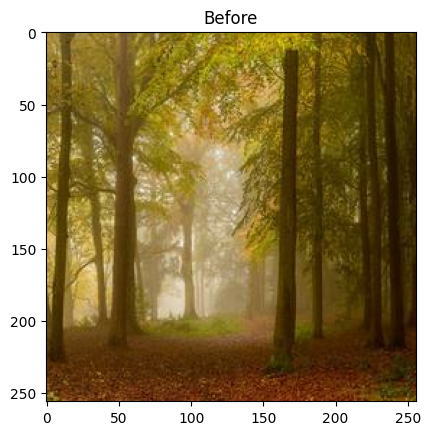

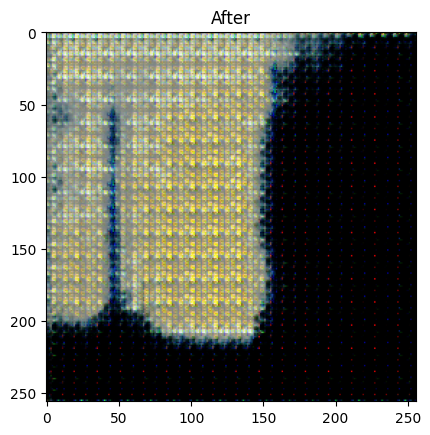

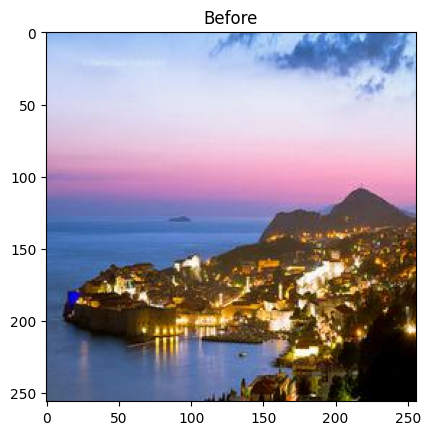

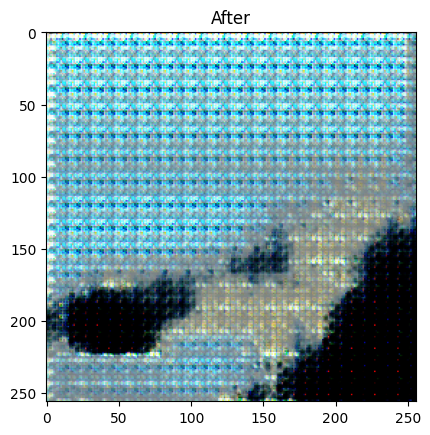

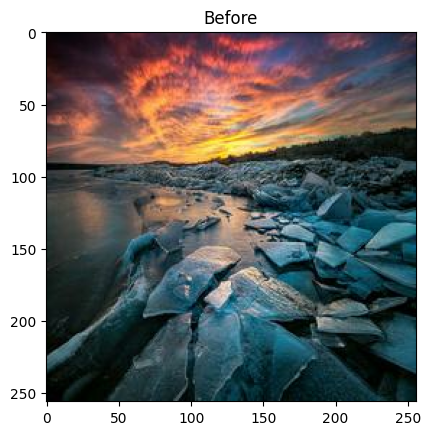

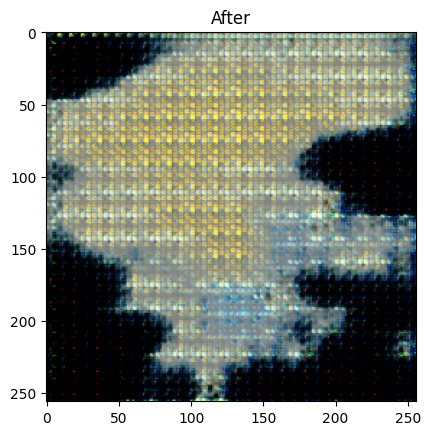

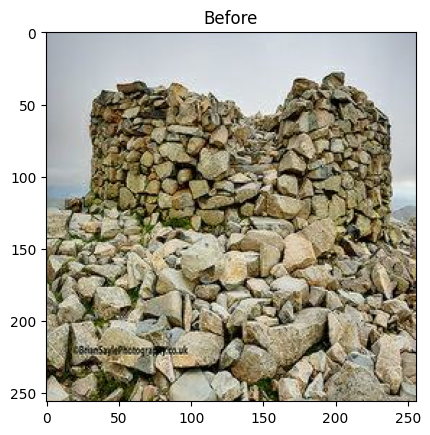

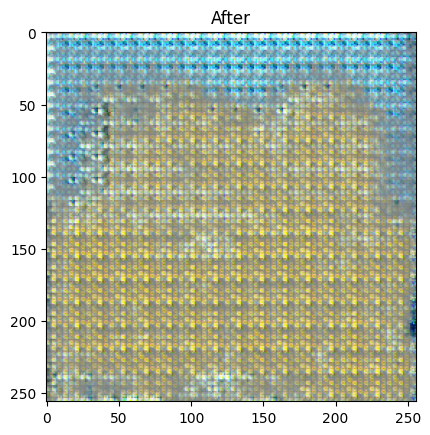

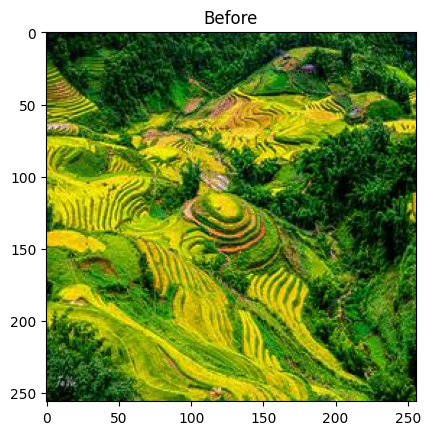

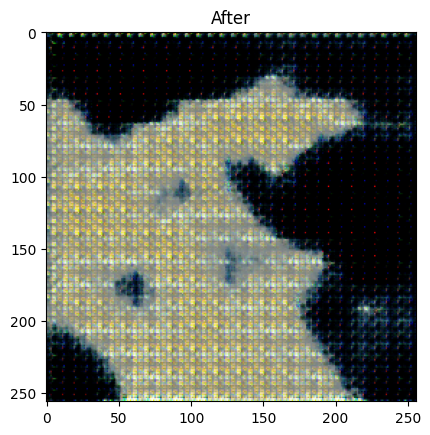

In [46]:
# Look at some images before and after the generator
for img in photo_dataset.take(5):
    plt.imshow(img[0] * 0.5 + 0.5)
    plt.title("Before")
    plt.show()
    plt.close()
    prediction = cycle_gan_model.gen1(img)[0]
    # Show an input image file
    plt.imshow(prediction * 0.5 + 0.5)
    plt.title("After")
    plt.show()
    plt.close()

This model is doing a better job of finding shapes, but it is not great at replicating the image yet. Let's implement some hyperparameter tuning to improve the accuracy of the GAN. We will iterate through learning rate, drop out rate, and leaky ReLU alpha values to determine which produces the lowest loss value for the monet generator loss (gen1). 

In [86]:
# Tuning

# Setup options
learning_rates = [0.001, 0.01]
drop_out_rates = [0.2, 0.3]
leaky_relu_alphas = [0.2, 0.3]

# Setup best storage
best_lr = None
best_dor = None
best_leaky_relu = None
best_model = None
best_hist = None
best_loss = 10000000
report = "| Learning Rate | Drop Out Rate | Leaky ReLU Alpha | Generator Loss |\n"

# Run tuning 
for lr in learning_rates:
    for dor in drop_out_rates:
        for alpha in leaky_relu_alphas:
            optimizer1 = tf.keras.optimizers.Adam(learning_rate=lr)
            optimizer2 = tf.keras.optimizers.Adam(learning_rate=lr)
            optimizer3 = tf.keras.optimizers.Adam(learning_rate=lr)
            optimizer4 = tf.keras.optimizers.Adam(learning_rate=lr)

            generator1 = build_generator()
            discriminator1 = build_discriminator(alpha, dor)
            generator2 = build_generator()
            discriminator2 = build_discriminator(alpha, dor)

            # Initialize, compile, and fit the model
            temp_model = CycleGAN(generator1, discriminator1, generator2, discriminator2)
            temp_model.compile(optimizer1, optimizer2, optimizer3, optimizer4, generator_loss, discriminator_loss, calc_cycle_loss, half_calc_cycle_loss)
            history = temp_model.fit(
                tf.data.Dataset.zip((monet_dataset, photo_dataset)),
                epochs=5
            )
            loss = history.history['monet_gen_loss'][-1]
            if loss < best_loss:
                best_loss = loss
                best_lr = lr
                best_dor = dor
                best_leaky_relu_alpha = alpha
                best_model = temp_model
                best_hist = history
            report += f"| {lr} | {dor} | {alpha} | {loss} |\n"

Epoch 1/5
300/300 [==============================] - 33s 52ms/step - monet_gen_loss: 24.7714 - photo_gen_loss: 26.3417 - monet_disc_loss: 1.0529 - photo_disc_loss: 1.1112
Epoch 2/5
300/300 [==============================] - 15s 51ms/step - monet_gen_loss: 29.8869 - photo_gen_loss: 29.3076 - monet_disc_loss: 2.6507 - photo_disc_loss: 2.6898
Epoch 3/5
300/300 [==============================] - 16s 52ms/step - monet_gen_loss: 26.7092 - photo_gen_loss: 26.9231 - monet_disc_loss: 2.4039 - photo_disc_loss: 2.7814
Epoch 4/5
300/300 [==============================] - 16s 53ms/step - monet_gen_loss: 28.0759 - photo_gen_loss: 28.2413 - monet_disc_loss: 2.1911 - photo_disc_loss: 2.0603
Epoch 5/5
300/300 [==============================] - 16s 53ms/step - monet_gen_loss: 31.7170 - photo_gen_loss: 27.6491 - monet_disc_loss: 1.7812 - photo_disc_loss: 2.1325
Epoch 1/5
300/300 [==============================] - 33s 53ms/step - monet_gen_loss: 24.0051 - photo_gen_loss: 26.4095 - monet_disc_loss: 1.4911 

In [87]:
print(report)

| Learning Rate | Drop Out Rate | Leaky ReLU Alpha | Generator Loss |
| 0.001 | 0.2 | 0.2 | 23.966293334960938 |
| 0.001 | 0.2 | 0.3 | 37.11687469482422 |
| 0.001 | 0.3 | 0.2 | 28.720712661743164 |
| 0.001 | 0.3 | 0.3 | 17.005151748657227 |
| 0.01 | 0.2 | 0.2 | 797.291748046875 |
| 0.01 | 0.2 | 0.3 | 1090.9376220703125 |
| 0.01 | 0.3 | 0.2 | 269.1456604003906 |
| 0.01 | 0.3 | 0.3 | 289.3439636230469 |



In [88]:
print(f"Best Loss: {best_loss}")
print(f"Best Learning Rate: {best_lr}")
print(f"Best Drop Out Rate: {best_dor}")
print(f"Best Leaky ReLU Alpha: {best_leaky_relu_alpha}")

Best Loss: 17.005151748657227
Best Learning Rate: 0.001
Best Drop Out Rate: 0.3
Best Leaky ReLU Alpha: 0.3


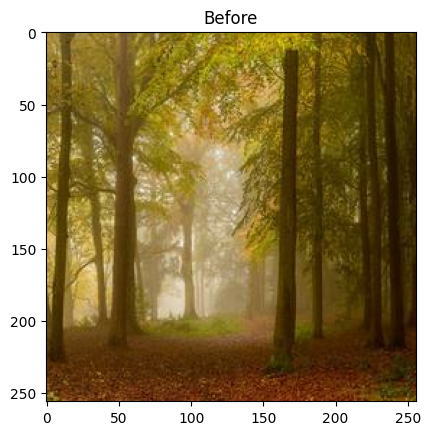

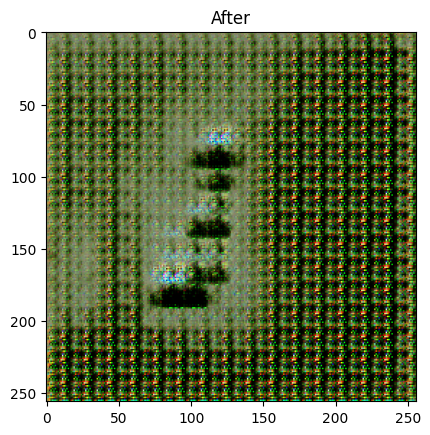

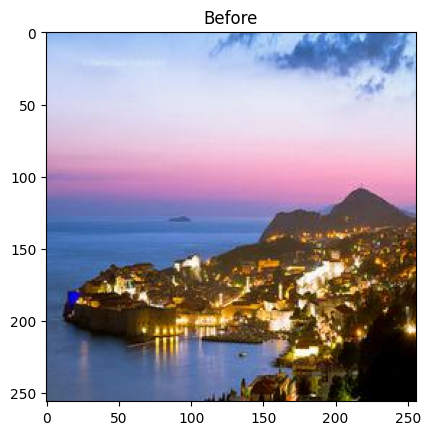

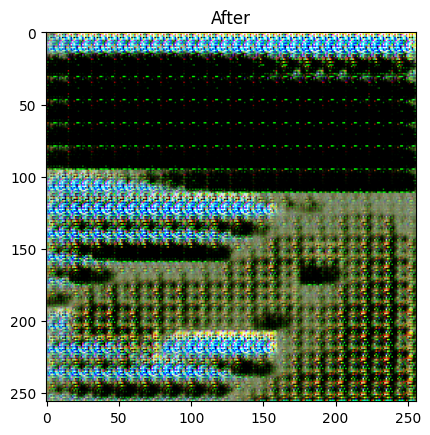

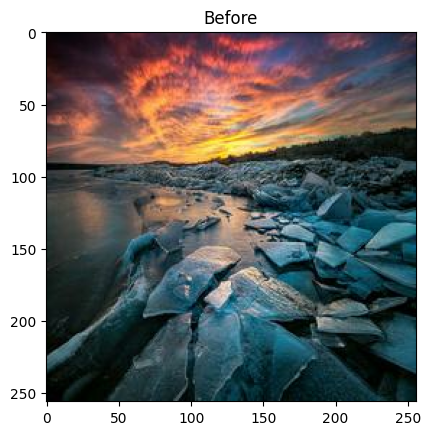

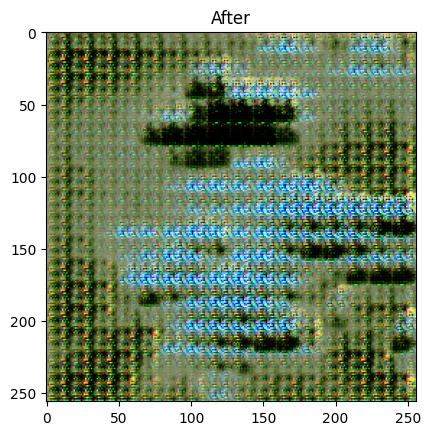

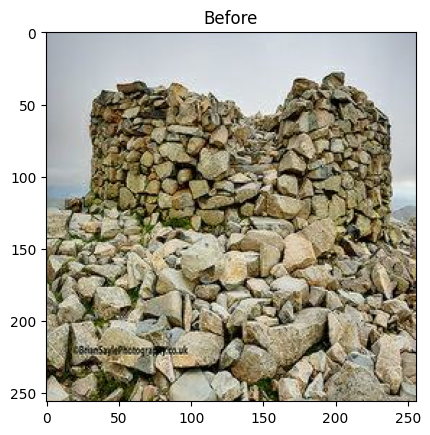

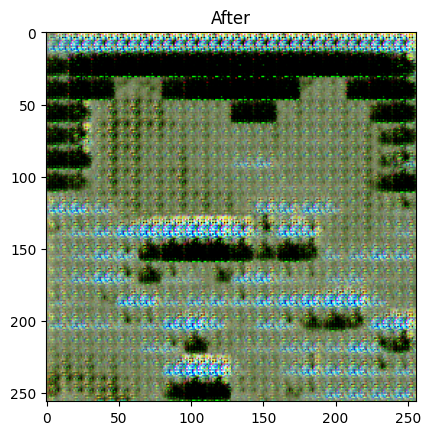

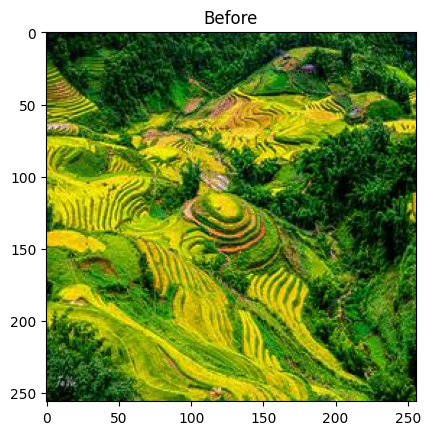

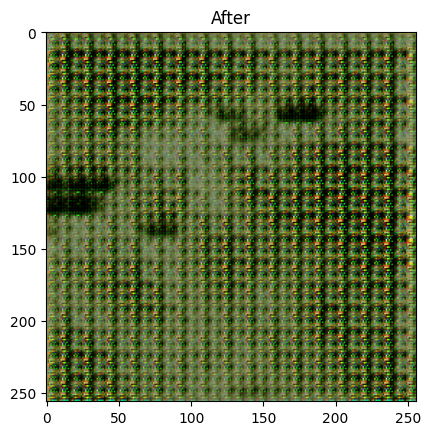

In [89]:
# Best Results
for img in photo_dataset.take(5):
    plt.imshow(img[0] * 0.5 + 0.5)
    plt.title("Before")
    plt.show()
    plt.close()
    prediction = best_model.gen1(img)[0]
    # Show an input image file
    plt.imshow(prediction * 0.5 + 0.5)
    plt.title("After")
    plt.show()
    plt.close()

In [93]:
optimizer1 = tf.keras.optimizers.Adam(learning_rate=best_lr)
optimizer2 = tf.keras.optimizers.Adam(learning_rate=best_lr)
optimizer3 = tf.keras.optimizers.Adam(learning_rate=best_lr)
optimizer4 = tf.keras.optimizers.Adam(learning_rate=best_lr)

generator1 = build_generator()
discriminator1 = build_discriminator(best_leaky_relu_alpha, best_dor)
generator2 = build_generator()
discriminator2 = build_discriminator(best_leaky_relu_alpha, best_dor)
        
# Initialize, compile, and fit the model
final_model = CycleGAN(generator1, discriminator1, generator2, discriminator2)
final_model.compile(optimizer1, optimizer2, optimizer3, optimizer4, generator_loss, discriminator_loss, calc_cycle_loss, half_calc_cycle_loss)
history = final_model.fit(
    tf.data.Dataset.zip((monet_dataset, photo_dataset)),
    epochs=30
)

Epoch 1/30
300/300 [==============================] - 33s 52ms/step - monet_gen_loss: 23.2382 - photo_gen_loss: 23.9166 - monet_disc_loss: 1.4965 - photo_disc_loss: 1.3920
Epoch 2/30
300/300 [==============================] - 16s 54ms/step - monet_gen_loss: 28.0721 - photo_gen_loss: 35.5537 - monet_disc_loss: 2.8590 - photo_disc_loss: 1.8022
Epoch 3/30
300/300 [==============================] - 16s 53ms/step - monet_gen_loss: 26.6566 - photo_gen_loss: 29.8870 - monet_disc_loss: 2.7268 - photo_disc_loss: 1.7589
Epoch 4/30
300/300 [==============================] - 16s 52ms/step - monet_gen_loss: 32.1746 - photo_gen_loss: 33.5674 - monet_disc_loss: 1.8130 - photo_disc_loss: 2.2863
Epoch 5/30
300/300 [==============================] - 16s 53ms/step - monet_gen_loss: 30.9586 - photo_gen_loss: 29.7037 - monet_disc_loss: 2.3643 - photo_disc_loss: 2.1922
Epoch 6/30
300/300 [==============================] - 16s 52ms/step - monet_gen_loss: 31.6261 - photo_gen_loss: 39.1821 - monet_disc_loss: 1

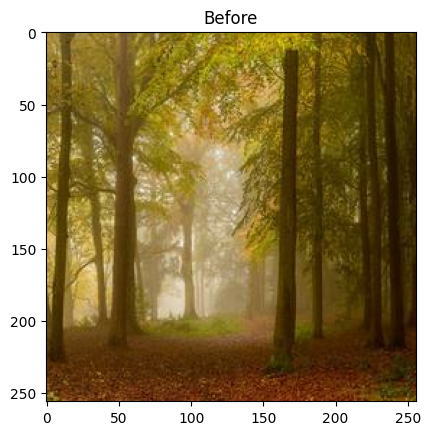

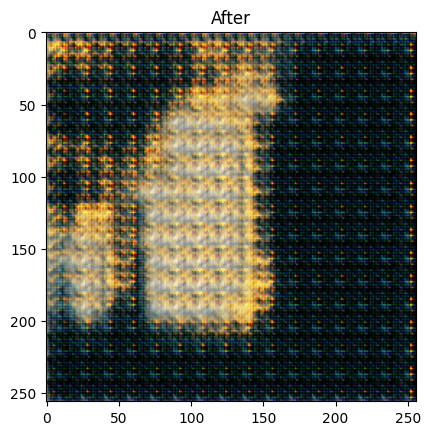

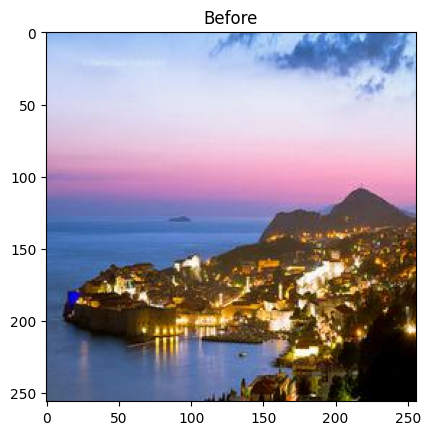

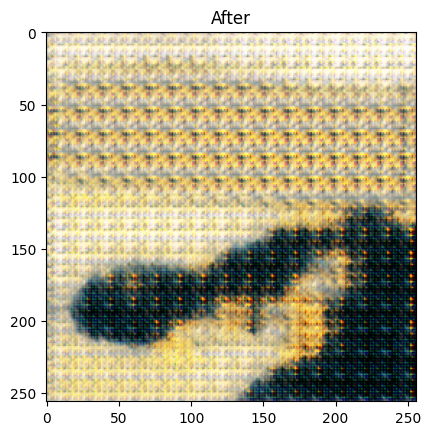

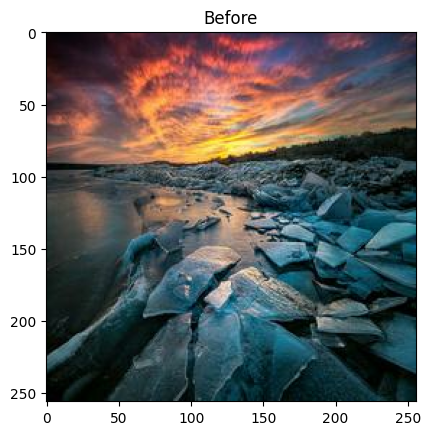

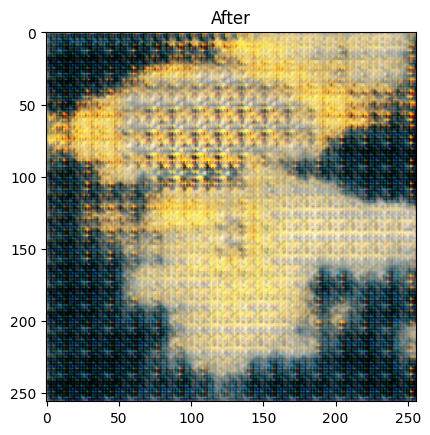

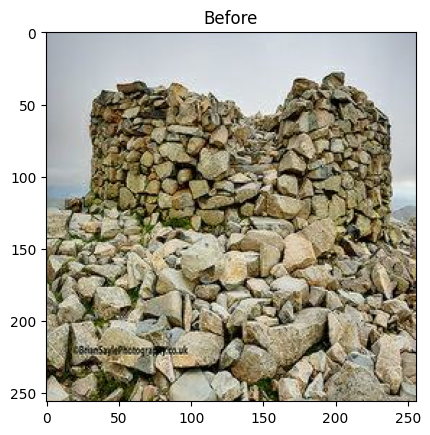

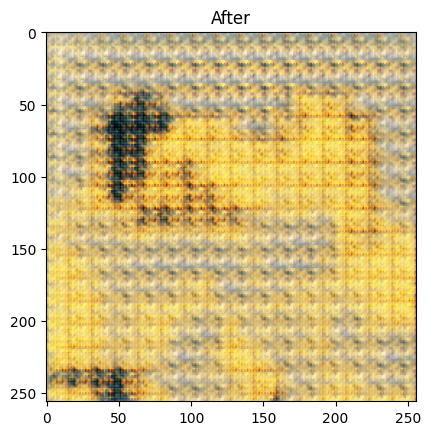

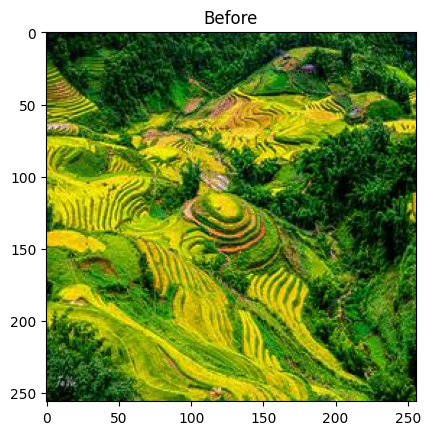

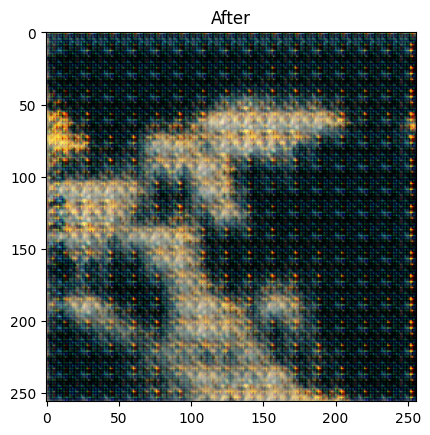

In [94]:
# Best Results
for img in photo_dataset.take(5):
    plt.imshow(img[0] * 0.5 + 0.5)
    plt.title("Before")
    plt.show()
    plt.close()
    prediction = final_model.gen1(img)[0]
    # Show an input image file
    plt.imshow(prediction * 0.5 + 0.5)
    plt.title("After")
    plt.show()
    plt.close()

In [95]:
# Make Submission Zip (derived from [3])
! mkdir ../tmp

i = 0
for img in photo_dataset:
    prediction = final_model.gen1(img)[0].numpy()
    prediction = (prediction*0.5+0.5).astype(np.uint8)
    im = Image.fromarray(prediction)
    im.save(os.path.join("..", "tmp", str(i+1) + ".jpg"))
    i+=1
print(i)

shutil.make_archive(os.path.join("images"), 'zip', os.path.join("..", "tmp"))

mkdir: cannot create directory ‘../tmp’: File exists
7038


'/kaggle/working/images.zip'

# Conclusion

Summary: Started with EDA and building the generator and discriminator architecture. Then tried implementing a Deep Convolutional GAN, which did not work very well. Then implemented a similar model to the one shown in the tutorial [3]. The CycleGAN worked much better. 

Key Takeaways: The more epochs the models were trained, the better these models got. Since the complexity of the problem was so great, it did not have overfitting issues like we have seen before. 

What went wrong: The first implementation of the GAN did not work as expected.

Future Improvements: Using MiFID as the loss function may have improved the results in the Kaggle Competition. 